# **Machine Learning para Business Intelligence** 
#### Profesor: Lucas Gómez Tobón

## 7. Random Forest and Boosting

In [50]:
import os
import pandas as pd
import numpy as np

In [51]:
os.listdir("../Data/")

['heart.csv', 'heart_noised.csv']

### Análisis preliminar

In [52]:
df = pd.read_csv('../Data/heart.csv')

In [53]:
# Para hacer este ejercicio más interesante le voy a agregar ruido a la base!
np.random.seed(666)
for i in range(6000):
    fila_i = np.random.randint(low = 0, high = df.shape[0])
    fila_j = np.random.randint(low = 0, high = df.shape[0])
    columna = np.random.randint(low = 0, high = df.shape[1])
    v_i = df.iloc[fila_i, columna]
    v_j = df.iloc[fila_j, columna]
    if columna != 13:
        mu = df.iloc[:, columna].mean()
        sigma = df.iloc[:, columna].std()
        v_i = v_i + np.random.normal(loc = mu, scale = sigma)
        v_j = v_j + np.random.normal(loc = mu, scale = sigma)
    else:
        v_i = np.abs(v_i - 1)
        v_j = np.abs(v_j - 1)
    df.iloc[fila_i, columna] = v_j 
    df.iloc[fila_i, columna] = v_i

In [54]:
df.to_csv('../Data/heart_noised.csv', index = False)

In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1025 entries, 0 to 1024
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1025 non-null   float64
 1   sex       1025 non-null   float64
 2   cp        1025 non-null   float64
 3   trestbps  1025 non-null   float64
 4   chol      1025 non-null   float64
 5   fbs       1025 non-null   float64
 6   restecg   1025 non-null   float64
 7   thalach   1025 non-null   float64
 8   exang     1025 non-null   float64
 9   oldpeak   1025 non-null   float64
 10  slope     1025 non-null   float64
 11  ca        1025 non-null   float64
 12  thal      1025 non-null   float64
 13  target    1025 non-null   int64  
dtypes: float64(13), int64(1)
memory usage: 112.2 KB


Diccionario de los datos

1. age
2. sex: 1 = male, 0 = female
3. cp: chest pain type (4 values)
4. resting blood pressure
5. serum cholestoral in mg/dl
6. fasting blood sugar > 120 mg/dl
7. resting electrocardiographic results (values 0,1,2)
8. maximum heart rate achieved
9. exercise induced angina
10. oldpeak = ST depression induced by exercise relative to rest
11. the slope of the peak exercise ST segment
12. number of major vessels (0-3) colored by flourosopy 
13. thal: 0 = normal; 1 = fixed defect; 2 = reversable defect

The names and social security numbers of the patients were recently removed from the database, replaced with dummy values.

In [56]:
df.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,52.000000,1.373218,0.000000,125.000000,212.000000,0.000000,1.000000,168.0,0.274898,1.547963,2.0,2.00000,3.000000,0
1,53.000000,1.000000,0.671645,375.385624,203.000000,1.000000,1.868619,155.0,1.000000,2.790761,0.0,-0.82283,3.000000,1
2,174.857682,1.462476,0.000000,145.000000,174.000000,0.744913,3.139549,125.0,1.279665,2.600000,0.0,0.00000,3.000000,0
3,61.000000,1.000000,0.083806,148.000000,496.055362,0.000000,1.000000,161.0,0.000000,1.012571,2.0,1.00000,4.480371,0
4,62.000000,0.814494,-0.832304,138.000000,294.000000,1.000000,1.000000,106.0,-0.545785,1.900000,1.0,3.00000,2.000000,0


In [57]:
df.target.value_counts()

0    527
1    498
Name: target, dtype: int64

In [58]:
df.target.value_counts(normalize = True)

0    0.514146
1    0.485854
Name: target, dtype: float64

In [59]:
# pip install pandas_profiling

In [60]:
import pandas_profiling as pp

In [61]:
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Pre procesamiento

In [62]:
from sklearn.model_selection import train_test_split

X = df.drop('target', axis = 1)
y = df["target"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state = 0)

In [63]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

### Árbol de decisión

In [64]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

In [65]:
tree = DecisionTreeClassifier(random_state = 123) 
grilla_tree = {"max_depth": [3, 5, 7, 9, 11, 13, 15, 17]}
tree_cv = GridSearchCV(tree, grilla_tree, scoring = "roc_auc", return_train_score = True, cv = 5)
tree_cv.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=123),
             param_grid={'max_depth': [3, 5, 7, 9, 11, 13, 15, 17]},
             return_train_score=True, scoring='roc_auc')

In [66]:
tree_cv.best_params_

{'max_depth': 5}

In [67]:
tree_cv.best_score_

0.5772073744714308

In [68]:
cv_tree_results = pd.DataFrame(tree_cv.cv_results_)

Text(0, 0.5, 'AUC')

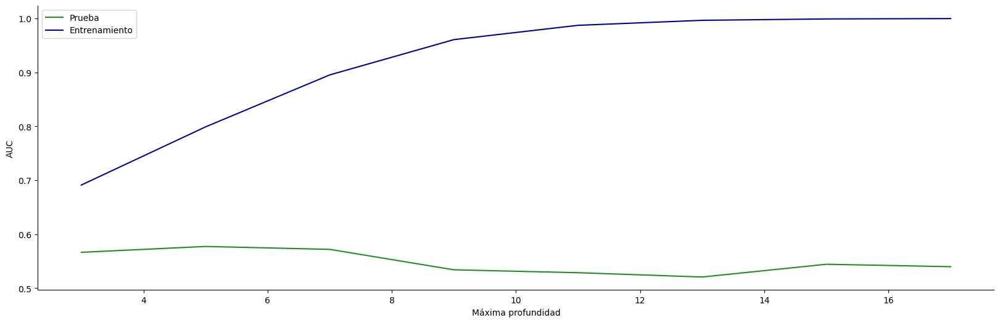

In [69]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Visualicemos
fig, ax = plt.subplots(figsize = (20, 6))
sns.despine()
sns.lineplot(data = cv_tree_results, x = 'param_max_depth', y = 'mean_test_score', ax = ax, color = "forestgreen",
             label = "Prueba")
sns.lineplot(data = cv_tree_results, x = 'param_max_depth', y = 'mean_train_score', ax = ax, color = "darkblue",
             label = "Entrenamiento")
plt.legend()
ax.set_xlabel("Máxima profundidad")
ax.set_ylabel("AUC")

In [70]:
# Creamos un dataframe con las importancias
importancia_arbol = pd.DataFrame(tree_cv.best_estimator_.feature_importances_, 
                                 index = X.columns, 
                                 columns = ['Importancia']).sort_values("Importancia", ascending = True)
importancia_arbol

,Importancia
trestbps,0.000000
fbs,0.000000
thal,0.000000
sex,0.044806
oldpeak,0.069315
thalach,0.073039
chol,0.074909
exang,0.077542
age,0.080362
restecg,0.107247


<AxesSubplot:>

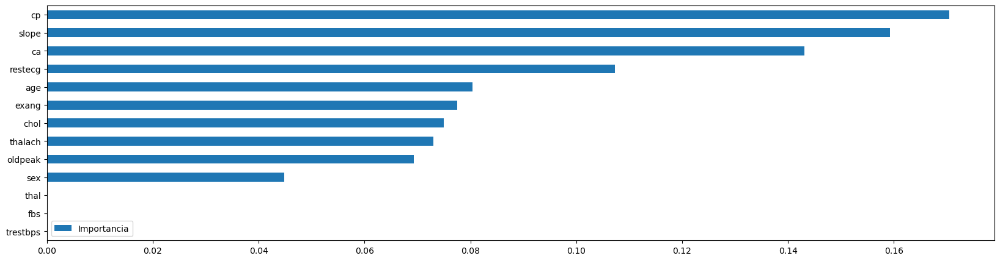

In [71]:
# Visualización de la importancia
importancia_arbol.plot(kind = 'barh', figsize = (20, 5))

### Random Forest

<center>
<img src="img/rf.png" alt="Random Forest" style="width: 700px;" align="center" frameborder="200"/>
</center>

El Random Forest es un modelo con muchos hiperparámetros. Veamos que pasaría si probaramos todas las combinaciones posibles de la siguiente grilla

In [72]:
grilla_rf = {'max_depth': [3, 5, 7, 10, None],
              'n_estimators': [10, 100, 200],
              'max_features': [1, 3, 5, 7],
              'min_samples_leaf': [1, 2, 3],
              'min_samples_split': [1, 2, 3]
           }

In [73]:
import itertools
keys, values = zip(*grilla_rf.items())
permutations_dicts = [dict(zip(keys, v)) for v in itertools.product(*values)]
permutations_dicts

[{'max_depth': 3,
  'n_estimators': 10,
  'max_features': 1,
  'min_samples_leaf': 1,
  'min_samples_split': 1},
 {'max_depth': 3,
  'n_estimators': 10,
  'max_features': 1,
  'min_samples_leaf': 1,
  'min_samples_split': 2},
 {'max_depth': 3,
  'n_estimators': 10,
  'max_features': 1,
  'min_samples_leaf': 1,
  'min_samples_split': 3},
 {'max_depth': 3,
  'n_estimators': 10,
  'max_features': 1,
  'min_samples_leaf': 2,
  'min_samples_split': 1},
 {'max_depth': 3,
  'n_estimators': 10,
  'max_features': 1,
  'min_samples_leaf': 2,
  'min_samples_split': 2},
 {'max_depth': 3,
  'n_estimators': 10,
  'max_features': 1,
  'min_samples_leaf': 2,
  'min_samples_split': 3},
 {'max_depth': 3,
  'n_estimators': 10,
  'max_features': 1,
  'min_samples_leaf': 3,
  'min_samples_split': 1},
 {'max_depth': 3,
  'n_estimators': 10,
  'max_features': 1,
  'min_samples_leaf': 3,
  'min_samples_split': 2},
 {'max_depth': 3,
  'n_estimators': 10,
  'max_features': 1,
  'min_samples_leaf': 3,
  'min_sam

Nota
---
En Python, el operador asterisco (`*`) se utiliza para desempaquetar elementos de una lista, tupla u otro iterable.

En el caso de la línea de código que mencionas, `zip(*grilla_rf.items())`, el operador asterisco se utiliza para desempaquetar los elementos del diccionario `grilla_rf` en dos secuencias separadas de claves y valores. Luego, estas dos secuencias se pasan como argumentos a la función `zip()`.

En resumen, `zip(*grilla_rf.items())` toma el diccionario `grilla_rf` y devuelve un iterable de tuplas, donde cada tupla contiene un par clave-valor del diccionario. Es decir, se está realizando una operación de "transposición" de los elementos del diccionario para poder iterar sobre las claves y valores por separado en lugar de iterar sobre el diccionario completo.

In [74]:
# Tenemos 540 combinaciones diferentes de hiperparámetros!
len(permutations_dicts)

540

In [75]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state = 123)
rf_cv = GridSearchCV(rf, grilla_rf, scoring = "roc_auc", return_train_score = True, cv = 5)
rf_cv.fit(X_train, y_train)

c:\Users\Lucas\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
900 fits failed out of a total of 2700.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
900 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Lucas\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Lucas\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 450, in fit
    trees = Parallel(
  File "C:\Users\Lucas\AppData\Roaming\Python\Python39\site-packages\joblib\parallel.py", line 1085, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Lucas\AppData\

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=123),
             param_grid={'max_depth': [3, 5, 7, 10, None],
                         'max_features': [1, 3, 5, 7],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [1, 2, 3],
                         'n_estimators': [10, 100, 200]},
             return_train_score=True, scoring='roc_auc')

In [76]:
rf_cv.best_params_

{'max_depth': 10,
 'max_features': 1,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 100}

In [77]:
rf_cv.best_score_

0.6724371294702619

In [78]:
cv_rf_results = pd.DataFrame(rf_cv.cv_results_)

In [79]:
cv_rf_results.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_max_depth', 'param_max_features', 'param_min_samples_leaf',
       'param_min_samples_split', 'param_n_estimators', 'params',
       'split0_test_score', 'split1_test_score', 'split2_test_score',
       'split3_test_score', 'split4_test_score', 'mean_test_score',
       'std_test_score', 'rank_test_score', 'split0_train_score',
       'split1_train_score', 'split2_train_score', 'split3_train_score',
       'split4_train_score', 'mean_train_score', 'std_train_score'],
      dtype='object')

Text(0, 0.5, 'AUC')

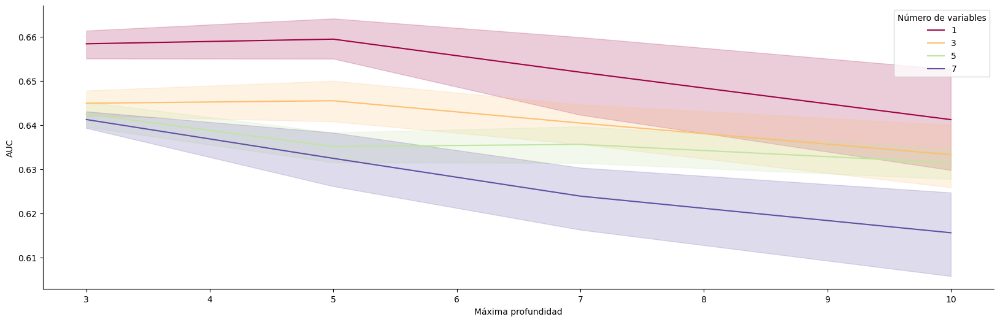

In [80]:
# Visualicemos
fig, ax = plt.subplots(figsize = (20, 6))
sns.despine()
sns.lineplot(data = cv_rf_results, x = 'param_max_depth', y = 'mean_test_score', ax = ax, hue = "param_max_features",
             palette = "Spectral")
plt.legend(title = "Número de variables")
ax.set_xlabel("Máxima profundidad")
ax.set_ylabel("AUC")

Text(0, 0.5, 'AUC')

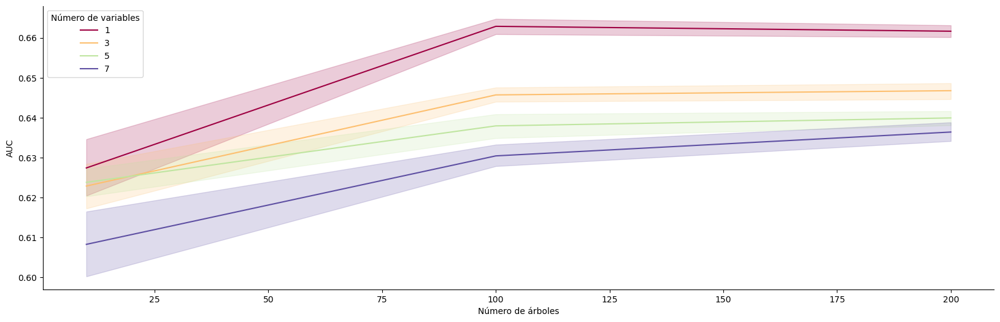

In [81]:
# Visualicemos
fig, ax = plt.subplots(figsize = (20, 6))
sns.despine()
sns.lineplot(data = cv_rf_results, x = 'param_n_estimators', y = 'mean_test_score', ax = ax, 
             hue = "param_max_features",
             palette = "Spectral")
plt.legend(title = "Número de variables")
ax.set_xlabel("Número de árboles")
ax.set_ylabel("AUC")

¿Cuál es la importancia de cada uno de los hiperparámetros?

In [82]:
variables = [i for i in cv_rf_results.columns if "param_" in i]
variables

['param_max_depth',
 'param_max_features',
 'param_min_samples_leaf',
 'param_min_samples_split',
 'param_n_estimators']

In [83]:
cv_rf_results = cv_rf_results.dropna()

In [84]:
from sklearn.linear_model import LinearRegression
X_rf = cv_rf_results[variables]
y_rf = cv_rf_results["mean_test_score"]

lr = LinearRegression()
lr.fit(X_rf, y_rf)

LinearRegression()

In [85]:
import re
variables = [re.sub("param_", "", i) for i in variables]
importancia_hp = pd.DataFrame({"Hiperparametro": variables, "Beta": lr.coef_})
importancia_hp["Importancia"] = importancia_hp["Beta"].abs()/importancia_hp["Beta"].abs().sum()
importancia_hp = importancia_hp.sort_values("Importancia", ascending = False)
importancia_hp

,Hiperparametro,Beta,Importancia
1,max_features,-0.003914,0.517934
0,max_depth,-0.002372,0.313869
2,min_samples_leaf,0.001075,0.142193
4,n_estimators,0.000118,0.015627
3,min_samples_split,0.000078,0.010377


[Text(0, 0, '51.0%'),
 Text(0, 0, '31.0%'),
 Text(0, 0, '14.0%'),
 Text(0, 0, '1.0%'),
 Text(0, 0, '1.0%')]

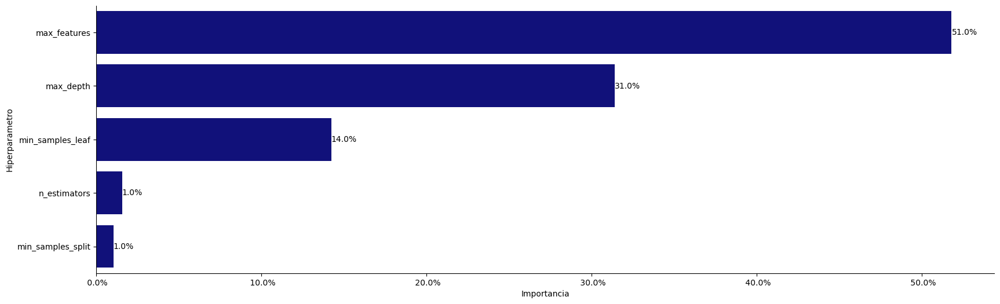

In [86]:
# Visualicemos
fig, ax = plt.subplots(figsize = (20, 6))
sns.despine()
sns.barplot(data = importancia_hp, x = "Importancia", y = "Hiperparametro", color = "darkblue", ax = ax)
ax.xaxis.set_major_formatter("{x: 0.1%}")
labels = [f"{100*i//1}%" for i in importancia_hp["Importancia"]]
ax.bar_label(ax.containers[0], labels = labels, label_type = 'edge', color = "black")

Ahora, definamos el espacio de hiperparámetros para implementar la búsqueda aleatoria. Este espacio de parámetros puede tener un rango de valores mayor que el que construimos para la búsqueda en cuadrícula, ya que la búsqueda aleatoria no prueba todas las combinaciones de hiperparámetros.

In [87]:
grilla_rf2 = {'max_depth':list(np.arange(2, 31, step = 2)) + [None],
              'n_estimators': np.arange(50, 500, step = 50),
              'max_features': np.arange(1, 13),
              'min_samples_leaf': np.arange(2, 50, step = 3),
              'min_samples_split': np.arange(2, 50, step = 3)
         }

In [88]:
from sklearn.model_selection import RandomizedSearchCV

rf2 = RandomForestClassifier(random_state = 123)
rf_cv2 = RandomizedSearchCV(rf2, grilla_rf2, n_iter = 100, scoring = "roc_auc", cv = 5, random_state = 123)
rf_cv2.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(random_state=123),
                   n_iter=100,
                   param_distributions={'max_depth': [2, 4, 6, 8, 10, 12, 14,
                                                      16, 18, 20, 22, 24, 26,
                                                      28, 30, None],
                                        'max_features': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
                                        'min_samples_leaf': array([ 2,  5,  8, 11, 14, 17, 20, 23, 26, 29, 32, 35, 38, 41, 44, 47]),
                                        'min_samples_split': array([ 2,  5,  8, 11, 14, 17, 20, 23, 26, 29, 32, 35, 38, 41, 44, 47]),
                                        'n_estimators': array([ 50, 100, 150, 200, 250, 300, 350, 400, 450])},
                   random_state=123, scoring='roc_auc')

Comparen tiempo de ejecución: Gris Search: 4 minutos, Random Search: 2 minutos.

In [89]:
rf_cv2.best_params_

{'n_estimators': 250,
 'min_samples_split': 29,
 'min_samples_leaf': 26,
 'max_features': 1,
 'max_depth': 20}

In [90]:
# Resultado Grid Search
rf_cv.best_score_

0.6724371294702619

In [91]:
# Resultado Random Search
rf_cv2.best_score_

0.6677371921548628

Llegamos a una configuración de hiperparámetros diferentes que nos dan los mismos excelentes resultados pero más rápido! Comparemos los diferentes modelos.

### Métricas de evaluación

#### ROC y AUC
AUC (Área bajo la curva) y ROC (Receiver Operating Characteristic) son términos comunes en el análisis de clasificación de datos.

ROC es una medida de la capacidad de un modelo para distinguir entre dos clases, generalmente denominadas "positiva" y "negativa". La curva ROC representa la tasa de verdaderos positivos (sensibilidad) en función de la tasa de falsos positivos (1 - especificidad) para varios umbrales de clasificación. Un modelo perfecto tendría una curva ROC que se elevaría rápidamente hacia el 100% de sensibilidad y mantendría una especificidad del 100%. En cambio, un modelo que clasifica al azar tendría una curva ROC que se asemejaría a una línea diagonal.

AUC es el área bajo la curva ROC. AUC es una medida agregada de la capacidad de un modelo para distinguir entre dos clases, que se calcula como el área bajo la curva ROC. Un modelo perfecto tendría un AUC de 1, mientras que un modelo que clasifica al azar tendría un AUC de 0,5. Por lo tanto, cuanto mayor sea el valor de AUC, mejor será el rendimiento del modelo.

En resumen, ROC es una curva que representa la relación entre la tasa de verdaderos positivos y la tasa de falsos positivos para diferentes umbrales de clasificación, mientras que AUC es un valor único que resume el rendimiento global de un modelo en términos de su capacidad para distinguir entre dos clases.

In [92]:
y_prob_tree = tree_cv.predict_proba(X_test)
y_prob_rf1 = rf_cv.predict_proba(X_test)
y_prob_rf2 = rf_cv2.predict_proba(X_test)

In [106]:
from sklearn.metrics import roc_curve, roc_auc_score
fpr1 , tpr1, thresholds1 = roc_curve(y_true = y_test, y_score = y_prob_tree[:, 1])
fpr2 , tpr2, thresholds2 = roc_curve(y_true = y_test, y_score = y_prob_rf1[:, 1])
fpr3 , tpr3, thresholds3 = roc_curve(y_true = y_test, y_score = y_prob_rf2[:, 1])

Text(0.5, 1.0, 'Receiver Operating Characteristic')

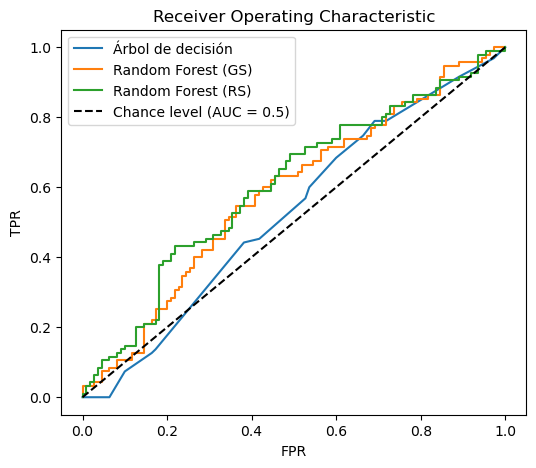

In [101]:
fig, ax = plt.subplots(figsize = (6, 5))
ax.plot(fpr1, tpr1, label = "Árbol de decisión")
ax.plot(fpr2, tpr2, label = "Random Forest (GS)")
ax.plot(fpr3, tpr3, label = "Random Forest (RS)")
ax.plot([0, 1], [0, 1], "k--", label = "Chance level (AUC = 0.5)")
ax.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title('Receiver Operating Characteristic')

In [107]:
auc1 = roc_auc_score(y_true = y_test, y_score = y_prob_tree[:, 1])
auc2 = roc_auc_score(y_true = y_test, y_score = y_prob_rf1[:, 1])
auc3 = roc_auc_score(y_true = y_test, y_score = y_prob_rf2[:, 1])

<BarContainer object of 1 artists>

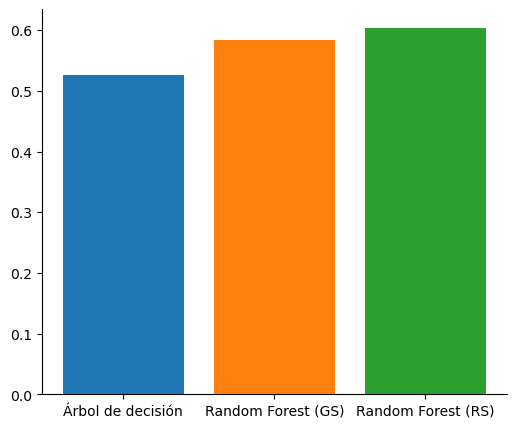

In [111]:
fig, ax = plt.subplots(figsize = (6, 5))
sns.despine()
ax.bar(x = "Árbol de decisión", height = auc1)
ax.bar(x = "Random Forest (GS)", height = auc2)
ax.bar(x = "Random Forest (RS)", height = auc3)

In [112]:
y_hat_tree = tree_cv.predict(X_test)
y_hat_rf1 = rf_cv.predict(X_test)
y_hat_rf2 = rf_cv2.predict(X_test)

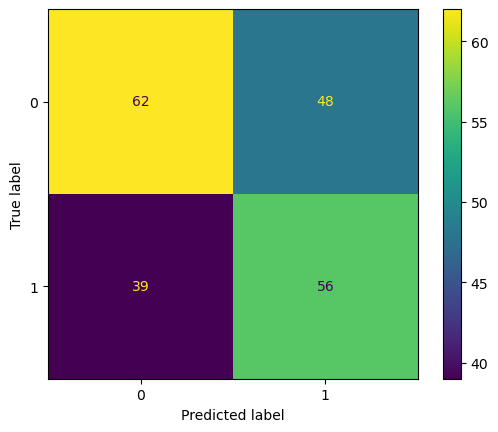

In [118]:
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_predictions(y_test, y_hat_rf2)

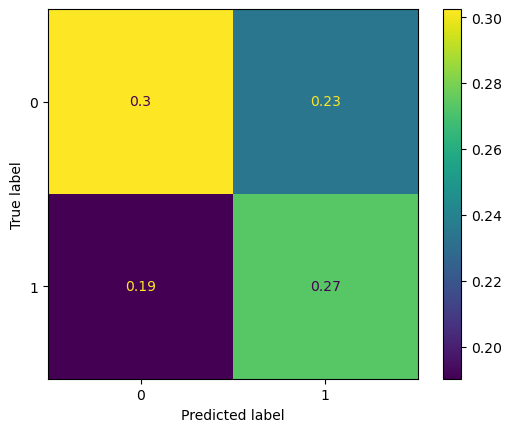

In [119]:
ConfusionMatrixDisplay.from_predictions(y_test, y_hat_rf2, normalize = "all")

In [128]:
from sklearn.metrics import classification_report

print(classification_report(y_true = y_test.values, y_pred = y_hat_rf2))

              precision    recall  f1-score   support

           0       0.61      0.56      0.59       110
           1       0.54      0.59      0.56        95

    accuracy                           0.58       205
   macro avg       0.58      0.58      0.58       205
weighted avg       0.58      0.58      0.58       205



### Boosting

<center>
<img src="img/boosting.png" alt="Boosting" style="width: 400px;" align="center"/>
</center>

In [135]:
from xgboost import XGBClassifier

grilla_xgb = { 
    # La tasa de aprendizaje determina la velocidad con la que el modelo aprende de los errores en cada iteración 
    # del algoritmo.
    "learning_rate": [0.0001,0.001, 0.01, 0.1, 1] ,
    "max_depth": range(3, 21, 3),
    # Controla la complejidad del modelo mediante la especificación del umbral mínimo requerido para dividir un 
    # nodo durante el entrenamiento del árbol.
    "gamma": [i/10.0 for i in range(0,5)],
    # Porcentaje de variables utilizadas para cada árbol
    "colsample_bytree": [i/10.0 for i in range(3, 10)],
    # Regularización Lasso
    "alpha": [1e-5, 1e-2, 0.1, 1, 10, 100],
    # Regularización Ridge
    "lambda": [1e-5, 1e-2, 0.1, 1, 10, 100],
    "scale_pos_weight": [1, 0.8, 0.5, 0.3]}

xgb = XGBClassifier(n_estimators = 500)
xgb_cv = RandomizedSearchCV(xgb, grilla_xgb, n_iter = 200, scoring = "recall", cv = 5, random_state = 123)
xgb_cv.fit(X_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, gpu_id=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           predictor=None, random_state=None, ...),
           

In [142]:
xgb_cv.best_params_

{'scale_pos_weight': 1,
 'max_depth': 3,
 'learning_rate': 0.0001,
 'lambda': 1,
 'gamma': 0.2,
 'colsample_bytree': 0.9,
 'alpha': 0.01}

In [143]:
xgb_cv.best_score_

0.6451543209876544

In [144]:
y_prob_xgb = xgb_cv.predict_proba(X_test)
y_hat_xgb = xgb_cv.predict(X_test)

fpr4 , tpr4, thresholds4 = roc_curve(y_true = y_test, y_score = y_prob_xgb[:, 1])
auc4 = roc_auc_score(y_true = y_test, y_score = y_prob_xgb[:, 1])

Text(0.5, 1.0, 'Receiver Operating Characteristic')

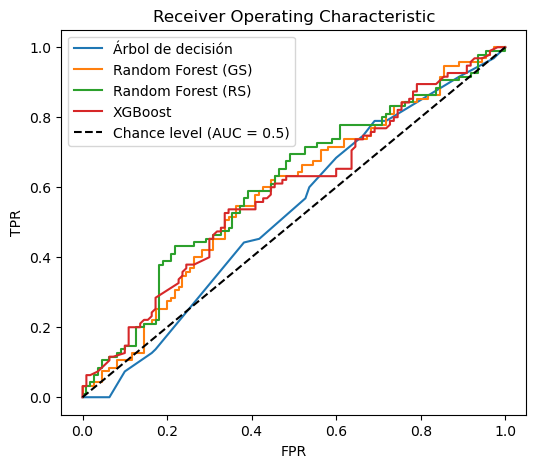

In [145]:
fig, ax = plt.subplots(figsize = (6, 5))
ax.plot(fpr1, tpr1, label = "Árbol de decisión")
ax.plot(fpr2, tpr2, label = "Random Forest (GS)")
ax.plot(fpr3, tpr3, label = "Random Forest (RS)")
ax.plot(fpr4, tpr4, label = "XGBoost")
ax.plot([0, 1], [0, 1], "k--", label = "Chance level (AUC = 0.5)")
ax.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title('Receiver Operating Characteristic')

<BarContainer object of 1 artists>

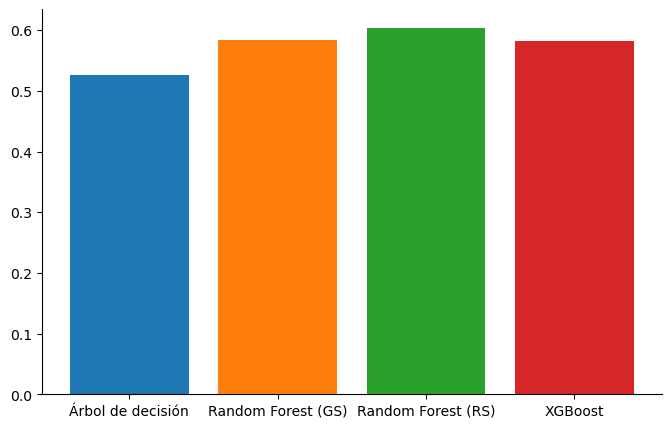

In [147]:
fig, ax = plt.subplots(figsize = (8, 5))
sns.despine()
ax.bar(x = "Árbol de decisión", height = auc1)
ax.bar(x = "Random Forest (GS)", height = auc2)
ax.bar(x = "Random Forest (RS)", height = auc3)
ax.bar(x = "XGBoost", height = auc4)

In [149]:
from sklearn.metrics import precision_recall_curve
precision1, recall1, thr1 = precision_recall_curve(y_true = y_test, probas_pred = y_prob_tree[:, 1])
precision2, recall2, thr2 = precision_recall_curve(y_true = y_test, probas_pred = y_prob_rf1[:, 1])
precision3, recall3, thr3 = precision_recall_curve(y_true = y_test, probas_pred = y_prob_rf2[:, 1])
precision4, recall4, thr4 = precision_recall_curve(y_true = y_test, probas_pred = y_prob_xgb[:, 1])

Text(0.5, 1.0, 'Precision-Recall Curve')

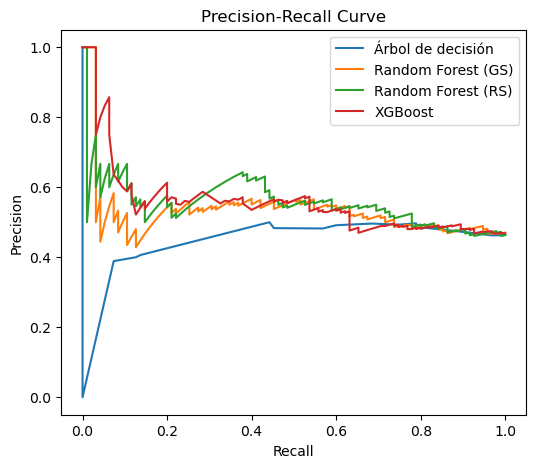

In [152]:
fig, ax = plt.subplots(figsize = (6, 5))
ax.plot(recall1, precision1, label = "Árbol de decisión")
ax.plot(recall2, precision2, label = "Random Forest (GS)")
ax.plot(recall3, precision3, label = "Random Forest (RS)")
ax.plot(recall4, precision4, label = "XGBoost")
ax.legend()
plt.ylabel("Precision")
plt.xlabel("Recall")
plt.title('Precision-Recall Curve')

In [154]:
print(classification_report(y_true = y_test, y_pred = y_hat_rf2))

              precision    recall  f1-score   support

           0       0.61      0.56      0.59       110
           1       0.54      0.59      0.56        95

    accuracy                           0.58       205
   macro avg       0.58      0.58      0.58       205
weighted avg       0.58      0.58      0.58       205



In [153]:
print(classification_report(y_true = y_test, y_pred = y_hat_xgb))

              precision    recall  f1-score   support

           0       0.61      0.55      0.58       110
           1       0.53      0.59      0.56        95

    accuracy                           0.57       205
   macro avg       0.57      0.57      0.57       205
weighted avg       0.57      0.57      0.57       205



In [167]:
thr_plot_xgb = pd.DataFrame({"Threshold": thr4, "Recall": recall4[1::], "Precision": precision4[1::]})

Text(0.5, 1.0, 'XGBoost')

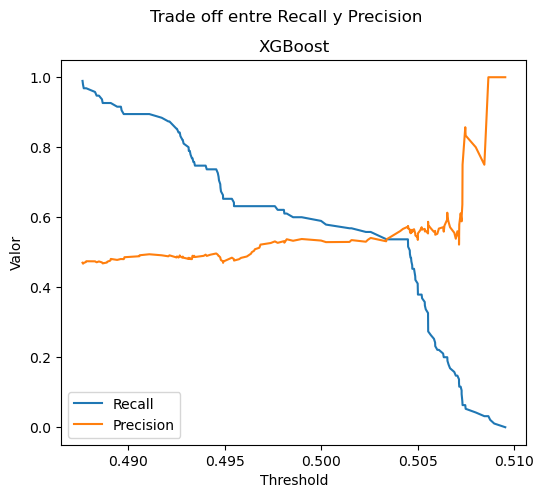

In [176]:
fig, ax = plt.subplots(figsize = (6, 5))
sns.lineplot(data = thr_plot_xgb, x = "Threshold", y = "Recall", ax = ax, label = "Recall")
sns.lineplot(data = thr_plot_xgb, x = "Threshold", y = "Precision", ax = ax, label = "Precision")
ax.legend()
plt.ylabel("Valor")
plt.suptitle("Trade off entre Recall y Precision")
plt.title("XGBoost")

In [174]:
thr_plot_rf = pd.DataFrame({"Threshold": thr3, "Recall": recall3[1::], "Precision": precision3[1::]})

Text(0.5, 1.0, 'Random Forest')

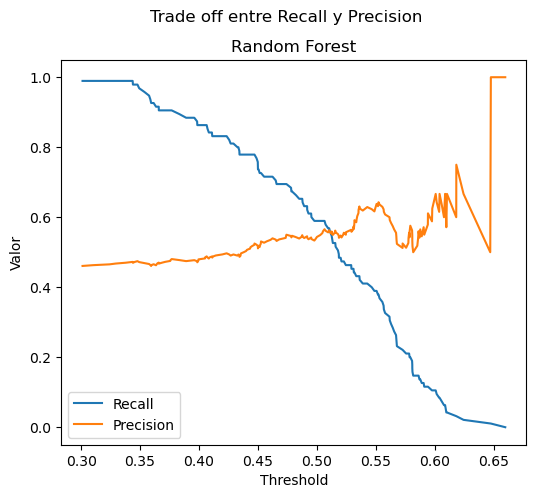

In [175]:
fig, ax = plt.subplots(figsize = (6, 5))
sns.lineplot(data = thr_plot_rf, x = "Threshold", y = "Recall", ax = ax, label = "Recall")
sns.lineplot(data = thr_plot_rf, x = "Threshold", y = "Precision", ax = ax, label = "Precision")
ax.legend()
plt.ylabel("Valor")
plt.suptitle("Trade off entre Recall y Precision")
plt.title("Random Forest")

In [180]:
thr_plot_rf.loc[thr_plot_rf["Recall"] > 0.9,].sort_values("Precision", ascending = False).head(3)

,Threshold,Recall,Precision
25,0.376779,0.905263,0.480447
24,0.375938,0.905263,0.477778
23,0.375579,0.905263,0.475138


In [181]:
thr_plot_xgb.loc[thr_plot_xgb["Recall"] > 0.9,].sort_values("Precision", ascending = False).head(3)

,Threshold,Recall,Precision
14,0.489082,0.926316,0.480874
16,0.489608,0.915789,0.480663
17,0.489645,0.905263,0.480447
